# Tema 8
## Librerías

In [ ]:
# Instalar bibliotecas necesarias
!pip install librosa

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
from scipy.fftpack import fft, ifft, fftfreq, fftshift, ifftshift, fft2, ifft2
import cv2
from google.colab import files

## Fourier

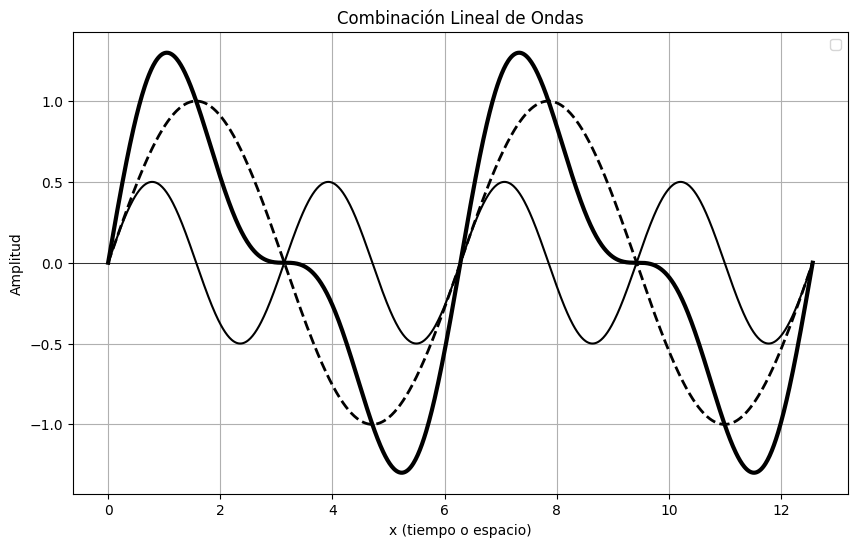

In [ ]:
# Valores del eje X (más periodos)
x = np.linspace(0, 4 * np.pi, 1000)

# Definir las funciones
y1 = np.sin(x)                       # Función base (discontinua)
y2 = 0.5 * np.sin(2 * x)             # Segunda función (continua fina)
y3 = y1 + y2                         # Combinación lineal (suma de ambas)

# Graficar
plt.figure(figsize=(10, 6))
plt.plot(x, y1, 'k--', linewidth=2)  # Línea discontinua
plt.plot(x, y2, 'k-', linewidth=1.5)  # Línea continua fina
plt.plot(x, y3, 'k', linewidth=3)  # Combinación lineal gruesa

# Configuración del gráfico
plt.title('Combinación Lineal de Ondas')
plt.xlabel('x (tiempo o espacio)')
plt.ylabel('Amplitud')
plt.axhline(0, color='black', linewidth=0.5)  # Eje X
plt.legend()
plt.grid()
plt.show()

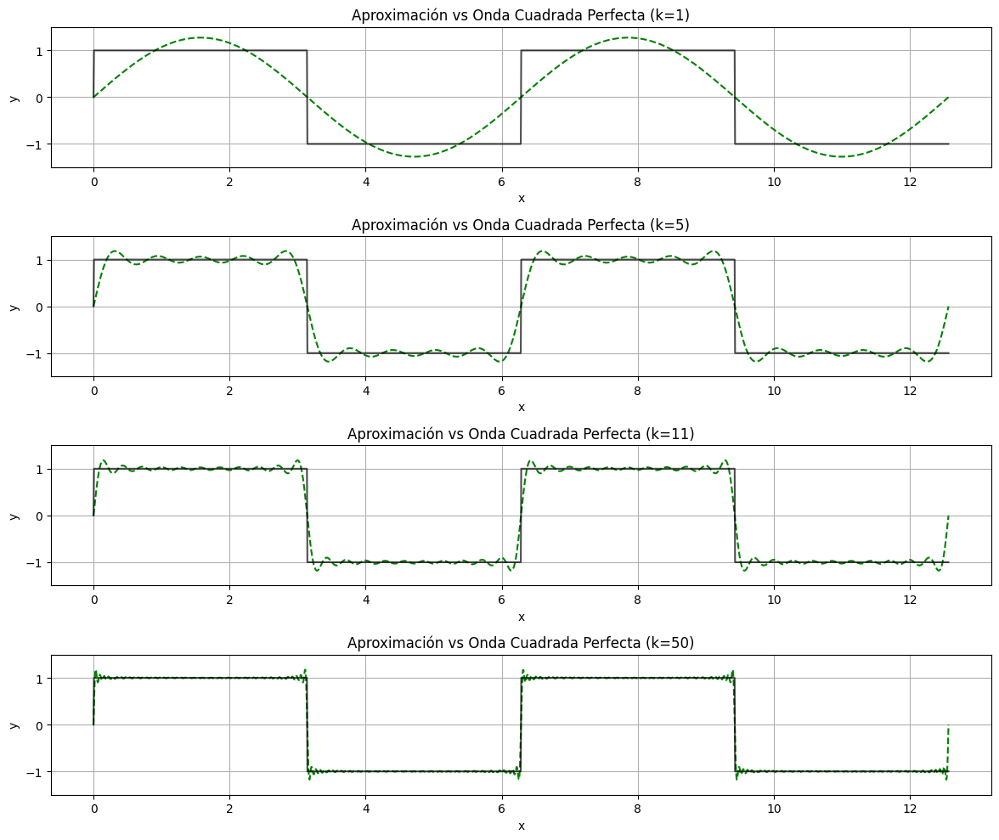

In [ ]:
# k: Número de términos de Fourier.
def square_wave_fourier(x, k):
    y = np.zeros_like(x) #array de ceros
    for n in range(1, k+1):
        y += (4 / (np.pi * (2*n - 1))) * np.sin((2*n - 1) * x)
    return y

# Configuración
x = np.linspace(0, 4 * np.pi, 2000)  # Más periodos en el eje X
terms = [1, 5, 11, 50]  # Número de términos para aproximar

plt.figure(figsize=(12, 10))

# Graficar la onda cuadrada perfecta y la aproximación
for i, k in enumerate(terms, 1):
    plt.subplot(len(terms), 1, i)
    y_fourier = square_wave_fourier(x, k)
    y_perfect = np.sign(np.sin(x))
    plt.plot(x, y_fourier, color='green',linestyle='--')
    plt.plot(x, y_perfect, color='black', alpha=0.7)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title(f'Aproximación vs Onda Cuadrada Perfecta (k={k})')
    plt.ylim(-1.5, 1.5)
    plt.grid()
plt.tight_layout()
plt.show()

Termino 1
ak =  [0.4052847716064347] bk =  [5.684341886080802e-17]
Termino 2
ak =  [0.4052847716064347, 0.20264244135878803] bk =  [5.684341886080802e-17, 0.0]
Termino 4
ak =  [0.4052847716064347, 0.20264244135878803, 0.04503167421143253, 4.5149069668089696e-18] bk =  [5.684341886080802e-17, 0.0, -5.684341886080802e-17, 9.473903143468002e-18]
Termino 10
ak =  [0.4052847716064347, 0.20264244135878803, 0.04503167421143253, 4.5149069668089696e-18, 0.016211426419863565, 0.0225158926614088, 0.008271154069164965, 1.15833268902558e-17, 0.0050035522787989315, 0.008105768765867999] bk =  [5.684341886080802e-17, 0.0, -5.684341886080802e-17, 9.473903143468002e-18, 2.842170943040401e-17, 0.0, -3.789561257387201e-17, -4.736951571734001e-18, 4.263256414560601e-17, 9.473903143468002e-18]
Termino 20
ak =  [0.4052847716064347, 0.20264244135878803, 0.04503167421143253, 4.5149069668089696e-18, 0.016211426419863565, 0.0225158926614088, 0.008271154069164965, 1.15833268902558e-17, 0.0050035522787989315, 0.0

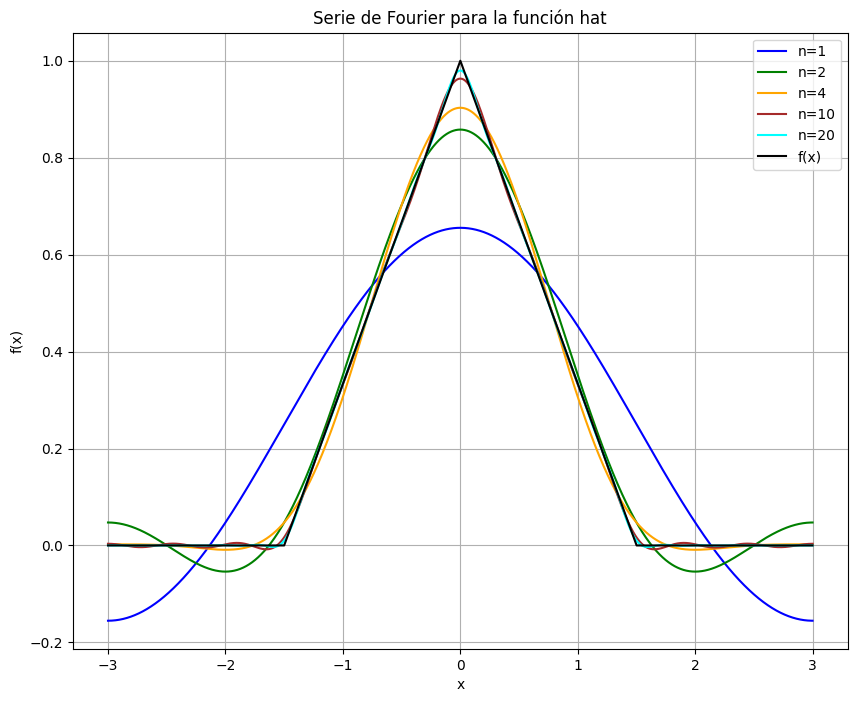

In [ ]:
# 1. Definir el dominio temporal
dx = 0.001  # Incremento
x = np.arange(-3, 3, dx)  # Vector x definido en [-3, 3]
L = 3

# 2. Definir la función triangular
f = np.zeros_like(x)  # Inicializar con ceros

# Crecimiento lineal desde x = -1.5 hasta x = 0
mask1 = (x >= -1.5) & (x <= 0)
f[mask1] = (x[mask1] + 1.5) / 1.5

# Decrecimiento lineal desde x = 0 hasta x = 1.5
mask2 = (x > 0) & (x <= 1.5)
f[mask2] = (1.5 - x[mask2]) / 1.5

# 3. Calcular los coeficientes de Fourier
def fourier_series(f, x, n_terms, L):
    A0 = np.sum(f * np.ones_like(x)) * (dx / L)  # Término constante
    fFS = A0 / 2  # Serie inicial
    ak = []  # Lista para los coeficientes a_k
    bk = []  # Lista para los coeficientes b_k

    for k in range(1, n_terms + 1):
        ak_k = np.sum(f * np.cos(k * np.pi * x / L)) * (dx / L)
        bk_k = np.sum(f * np.sin(k * np.pi * x / L)) * (dx / L)
        fFS += ak_k * np.cos(k * np.pi * x / L) + bk_k * np.sin(k * np.pi * x / L)
        ak.append(ak_k)
        bk.append(bk_k)

    return fFS, ak, bk

# 4. Representar la función original y su serie de Fourier
n_terms_list = [1, 2, 4, 10, 20]  # Número de términos
colors = ['b', 'g', 'orange', 'brown', 'cyan']

plt.figure(figsize=(10, 8))

# Gráfico de la aproximación de Fourier para diferentes n
for i, n_terms in enumerate(n_terms_list):
    fFS, _a, _b = fourier_series(f, x, n_terms, L)
    print('Termino', n_terms)
    print('ak = ', _a, 'bk = ', _b)
    plt.plot(x, fFS, label=f'n={n_terms}', color=colors[i])

plt.plot(x, f, 'k', linewidth=1.5, label='f(x)')  # Función original
plt.title('Serie de Fourier para la función hat')
plt.xlabel('x')
plt.ylabel('f(x)')
plt.legend()
plt.grid(True)
plt.show()

Termino 1
ak =  [7.579122514774402e-17] bk =  [0.8105695432128696]
Termino 2
ak =  [7.579122514774402e-17, 0.0] bk =  [0.8105695432128696, 1.8947806286936004e-17]
Termino 4
ak =  [7.579122514774402e-17, 0.0, 9.473903143468002e-17, -1.5158245029548803e-16] bk =  [0.8105695432128696, 1.8947806286936004e-17, -0.09006334842286506, -1.8947806286936004e-17]
Termino 10
ak =  [7.579122514774402e-17, 0.0, 9.473903143468002e-17, -1.5158245029548803e-16, 6.631732200427601e-17, 0.0, 7.579122514774402e-17, -1.3500311979441903e-16, 8.052817671947801e-17, -4.736951571734001e-18] bk =  [0.8105695432128696, 1.8947806286936004e-17, -0.09006334842286506, -1.8947806286936004e-17, 0.03242285283972714, 1.8947806286936004e-17, -0.016542308138329895, 1.4210854715202004e-17, 0.010007104557597865, 4.736951571734001e-18]
Termino 20
ak =  [7.579122514774402e-17, 0.0, 9.473903143468002e-17, -1.5158245029548803e-16, 6.631732200427601e-17, 0.0, 7.579122514774402e-17, -1.3500311979441903e-16, 8.052817671947801e-17, -

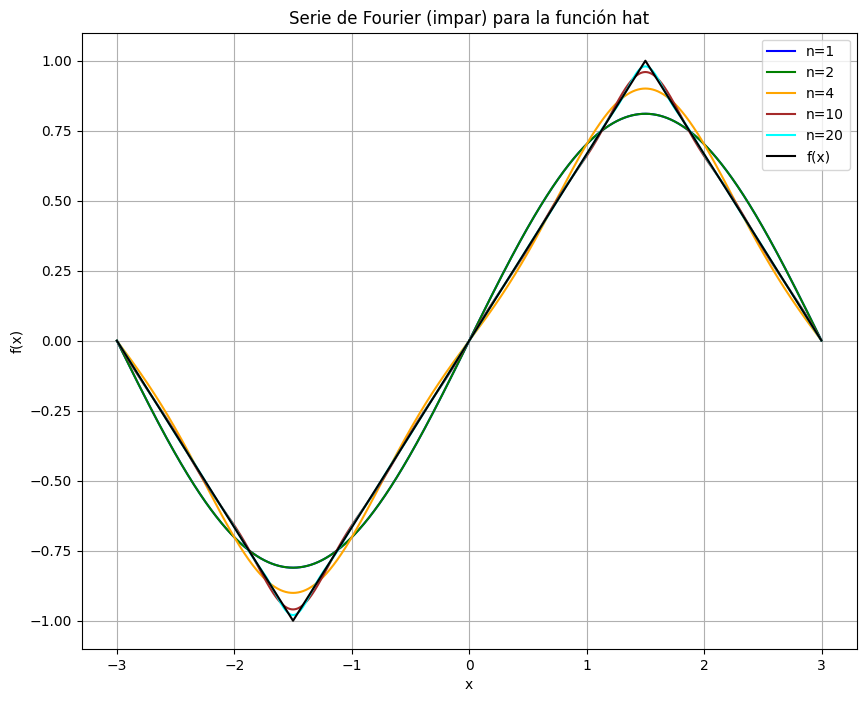

In [ ]:
# 1. Definir el dominio temporal
dx = 0.001  # Incremento
x = np.arange(-3, 3, dx)  # Vector x definido en [-3, 3]

# 2. Definir la función triangular modificada
f = np.zeros_like(x)  # Inicializar con ceros

# Región constante igual a 1 entre [-3, -1.5]
mask_const1 = (x >= -3) & (x < -1.5)
f[mask_const1] = -(2/3) * x[mask_const1] - 2

# Crecimiento lineal desde x = -1.5 hasta x = 0 (rampa descendente)
mask1 = (x >= -1.5) & (x <= 0)
f[mask1] = (x[mask1]) / 1.5

# Decrecimiento lineal desde x = 0 hasta x = 1.5 (rampa ascendente)
mask2 = (x > 0) & (x <= 1.5)
f[mask2] = (x[mask2]) / 1.5

# Región constante igual a 1 entre [1.5, 3]
mask_const2 = (x > 1.5) & (x <= 3)
f[mask_const2] = -(2/3) * x[mask_const2] + 2

# 3. Calcular los coeficientes de Fourier
def fourier_series(f, x, n_terms, L):
    A0 = np.sum(f * np.ones_like(x)) * (dx / L)  # Término constante
    fFS = A0 / 2  # Serie inicial
    ak = []  # Lista para los coeficientes a_k
    bk = []  # Lista para los coeficientes b_k

    for k in range(1, n_terms + 1):
        ak_k = np.sum(f * np.cos(k * np.pi * x / L)) * (dx / L)
        bk_k = np.sum(f * np.sin(k * np.pi * x / L)) * (dx / L)
        fFS += ak_k * np.cos(k * np.pi * x / L) + bk_k * np.sin(k * np.pi * x / L)
        ak.append(ak_k)
        bk.append(bk_k)

    return fFS, ak, bk

# 4. Representar la función original y su serie de Fourier
n_terms_list = [1, 2, 4, 10, 20]  # Número de términos
colors = ['b', 'g', 'orange', 'brown', 'cyan']

plt.figure(figsize=(10, 8))

# Gráfico de la aproximación de Fourier para diferentes n
for i, n_terms in enumerate(n_terms_list):
    fFS, _a, _b = fourier_series(f, x, n_terms, L)
    print('Termino', n_terms)
    print('ak = ', _a, 'bk = ', _b)
    plt.plot(x, fFS, label=f'n={n_terms}', color=colors[i])

plt.plot(x, f, 'k', linewidth=1.5, label='f(x)')  # Función original
plt.title('Serie de Fourier (impar) para la función hat')
plt.xlabel('x')
plt.ylabel('f(x)')
plt.legend()
plt.grid(True)
plt.show()

Sube un archivo de audio (.wav o .mp3):


Saving Record (online-voice-recorder.com).mp3 to Record (online-voice-recorder.com).mp3
Analizando el archivo: Record (online-voice-recorder.com).mp3
Frecuencia de muestreo (sr): 48000 Hz


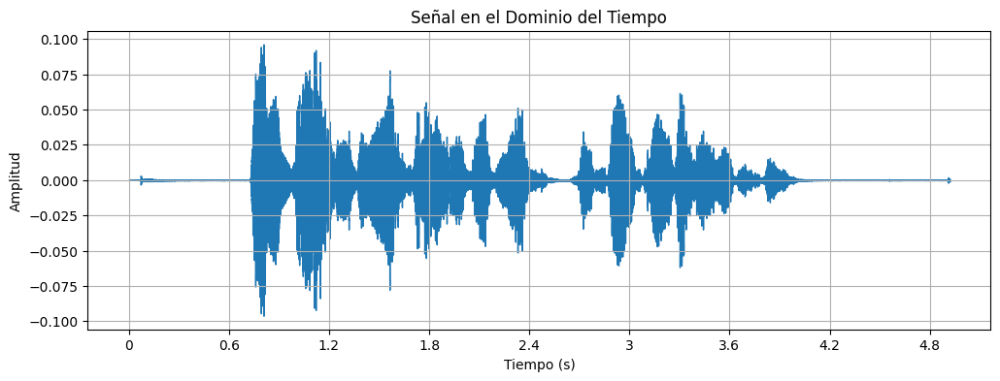

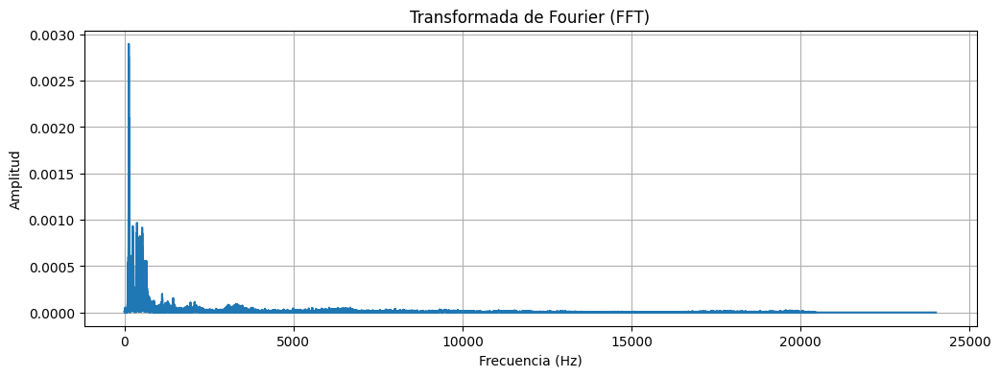

Duración del audio: 4.92 segundos
Frecuencia de muestreo: 48000 Hz


In [ ]:
# Subir archivo
from google.colab import files

print("Sube un archivo de audio (.wav o .mp3):")
uploaded = files.upload()  # Permite subir un archivo desde tu ordenador

# Obtener el nombre del archivo subido
audio_file = list(uploaded.keys())[0]

# Leer el archivo de audio
print(f"Analizando el archivo: {audio_file}")
y, sr = librosa.load(audio_file, sr=None)
#y va a ser el array con las amplitudes de señal
# sr es la frecuencia de muestreo (muestras/s)
print(f"Frecuencia de muestreo (sr): {sr} Hz")

# Visualizar el audio en el dominio del tiempo
plt.figure(figsize=(12, 4))
librosa.display.waveshow(y, sr=sr)
plt.title("Señal en el Dominio del Tiempo")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.grid()
plt.show()

# Calcular y visualizar la FFT (Transformada de Fourier)
n = len(y)  # Número de muestras
yf = fft(y)  # Aplicar FFT
xf = np.linspace(0.0, sr/2, n//2)
# Xf es el Eje de frecuencia (de 0 a la mitad de la frecunecia de muestreo)
# la FFT retorna frecuencias positivas y negativas. Nos quedamos con las positivas n//2

# Graficar la FFT
plt.figure(figsize=(12, 4))
plt.plot(xf, 2.0/n * np.abs(yf[:n//2]))
plt.title("Transformada de Fourier (FFT)")
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Amplitud")
plt.grid()
plt.show()

# Mostrar información del audio
print(f"Duración del audio: {len(y)/sr:.2f} segundos")
print(f"Frecuencia de muestreo: {sr} Hz")

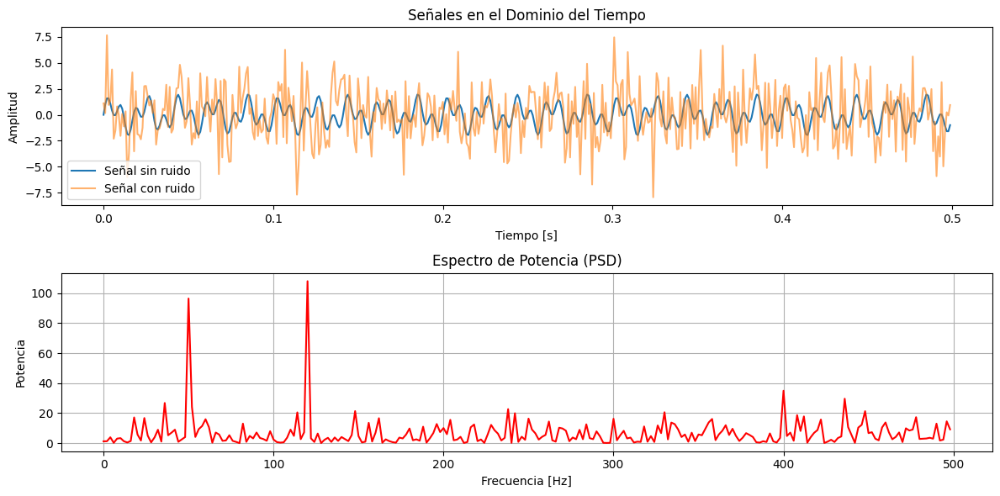

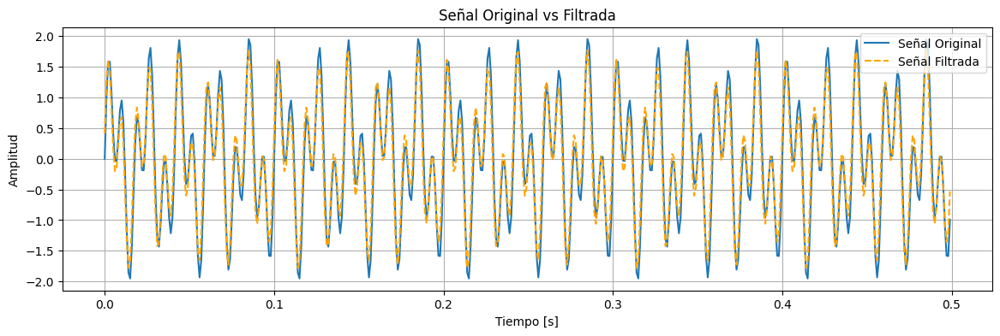

In [ ]:
# fijar semilla
np.random.seed(5)
# Definir el dominio temporal
dt = 0.001  # Incremento de tiempo
t = np.arange(0, 0.5, dt)  # Vector de tiempo

# Definir f(t) y añadir ruido Gaussiano
fclean = np.sin(2 * np.pi * 50 * t) + np.sin(2 * np.pi * 120 * t)  # Suma de 2 frecuencias
f = fclean + 2.5 * np.random.randn(len(t))  # Añadir ruido gaussiano

# Calcular la FFT
n = len(t)  # Longitud del tiempo
fhat = fft(f)  # FFT de la señal ruidosa
PSD = np.abs(fhat)**2 / n  # Espectro de potencia
freq = np.fft.fftfreq(n, dt)  # Dominio de frecuencias

# Visualizar la señal original y la ruidosa
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(t, fclean, label='Señal sin ruido')
plt.plot(t, f, label='Señal con ruido', alpha=0.6)
plt.title("Señales en el Dominio del Tiempo")
plt.xlabel("Tiempo [s]")
plt.ylabel("Amplitud")
plt.legend()

# Visualizar el espectro de potencia
plt.subplot(2, 1, 2)
plt.plot(freq[:n // 2], PSD[:n // 2], color='r', lw=1.5)
plt.title("Espectro de Potencia (PSD)")
plt.xlabel("Frecuencia [Hz]")
plt.ylabel("Potencia")
plt.grid()
plt.tight_layout()
plt.show()

# Eliminar ruido usando el PSD
indices = PSD > 80  # Seleccionar frecuencias con mayor potencia
fhat_clean = fhat * indices  # Filtrar las componentes menos importantes
f_filtered = np.real(ifft(fhat_clean))  # Transformada inversa FFT

# Comparar la señal filtrada con la original
plt.figure(figsize=(14, 4))
plt.plot(t, fclean, label='Señal Original')
# plt.plot(t, f, label='Señal con Ruido', c='orange',alpha=0.6)
plt.plot(t, f_filtered, label='Señal Filtrada',c='orange', linestyle='--')
plt.title("Señal Original vs Filtrada")
plt.xlabel("Tiempo [s]")
plt.ylabel("Amplitud")
plt.legend()
plt.grid()
plt.show()

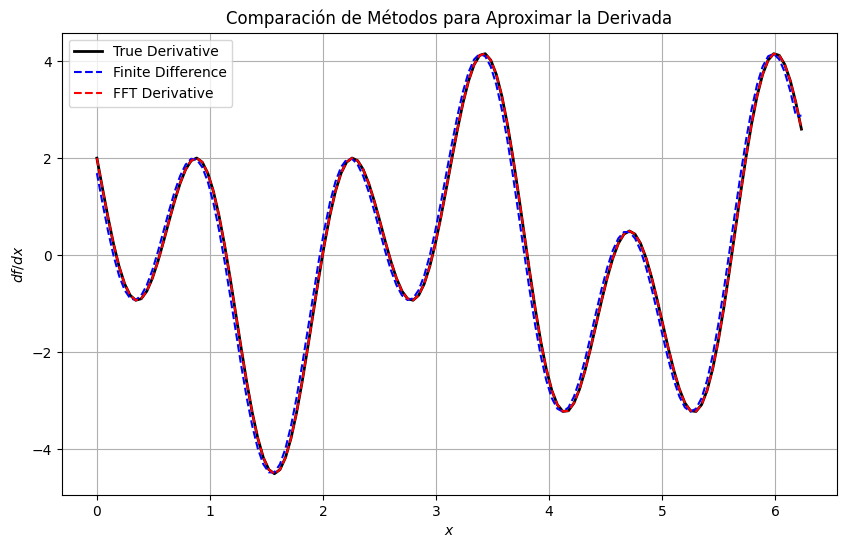

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


# Definimos la función original
def f(x):
    return np.sin(2 * x) + 0.5 * np.cos(5 * x)

def df_true(x):
    return 2 * np.cos(2 * x) - 2.5 * np.sin(5 * x)  # Derivada exacta

# Parámetros
L = 2 * np.pi       # Longitud del dominio
N = 128             # Número de puntos
x = np.linspace(0, L, N, endpoint=False)  # Puntos en el dominio
dx = x[1] - x[0]    # Paso de discretización

# Valores de la función y derivada exacta
y = f(x)
y_true = df_true(x)

# 1. Derivada usando diferencias finitas
y_fd = np.zeros_like(y)
y_fd[:-1] = (y[1:] - y[:-1]) / dx  # Diferencia hacia adelante
y_fd[-1] = y_fd[-2]  # Asumimos la última igual para evitar desborde

# 2. Derivada usando FFT
k = fftfreq(N, d=dx) * 2 * np.pi  # Frecuencias angulares
y_fft = fft(y)                    # Transformada de Fourier

y_fft_derivative = 1j * k * y_fft # Multiplicamos por i*k

y_fft_derivative_real = np.real(ifft(y_fft_derivative))  # Transformada inversa

# Graficamos los resultados
plt.figure(figsize=(10, 6))
plt.plot(x, y_true, 'k', label='True Derivative', linewidth=2)
plt.plot(x, y_fd, 'b--', label='Finite Difference')
plt.plot(x, y_fft_derivative_real, 'r--', label='FFT Derivative')
plt.xlabel('$x$')
plt.ylabel('$df/dx$')
plt.legend()
plt.title('Comparación de Métodos para Aproximar la Derivada')
plt.grid()
plt.show()

### FFTSHIFT?
Cuando se aplica la Transformada de Fourier 2D (usando fft2), las frecuencias bajas (que representan las componentes más importantes y suaves de la imagen) se encuentran en las esquinas de la matriz resultante. Por el contrario, las frecuencias altas (que representan los detalles y bordes) se encuentran cerca del centro.

fftshift mueve las frecuencias bajas desde las esquinas al centro de la imagen espectral.

Saving bordes inclinados.jpg to bordes inclinados (1).jpg


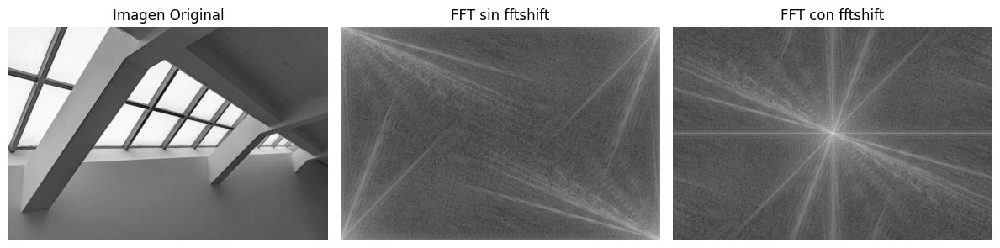

In [ ]:
# Subir una imagen desde el equipo
uploaded = files.upload()
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Calcular la Transformada de Fourier
fft_no_shift = fft2(image)           # Sin aplicar fftshift
fft_with_shift = fftshift(fft2(image))  # Aplicando fftshift

# Obtener el espectro de frecuencias
magnitude_no_shift = np.log(1 + np.abs(fft_no_shift))  # Magnitud sin fftshift
magnitude_with_shift = np.log(1 + np.abs(fft_with_shift))  # Magnitud con fftshift

# Mostrar resultados
plt.figure(figsize=(12, 6))

# Imagen original
plt.subplot(1, 3, 1)
plt.imshow(image, cmap='gray')
plt.title("Imagen Original")
plt.axis('off')

# Espectro sin fftshift
plt.subplot(1, 3, 2)
plt.imshow(magnitude_no_shift, cmap='gray')
plt.title("FFT sin fftshift")
plt.axis('off')

# Espectro con fftshift
plt.subplot(1, 3, 3)
plt.imshow(magnitude_with_shift, cmap='gray')
plt.title("FFT con fftshift")
plt.axis('off')

plt.tight_layout()
plt.show()

Saving Steve-Mccurry-Afghan.jpg to Steve-Mccurry-Afghan.jpg


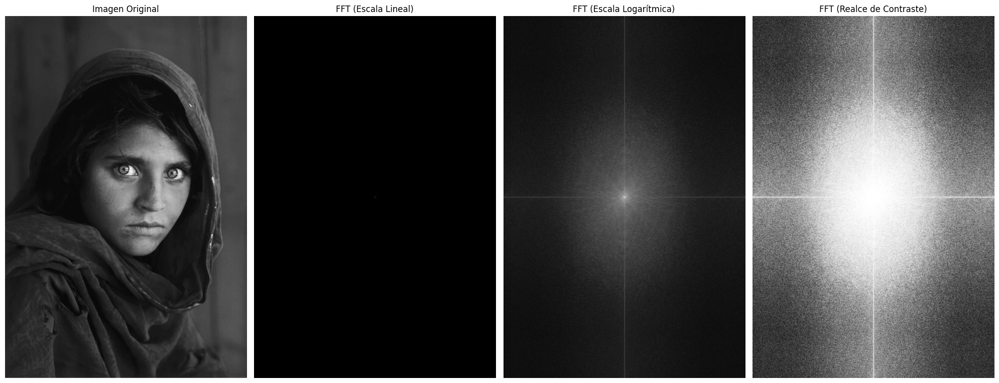

In [ ]:
# Subir imagen desde tu equipo local
from google.colab import files
uploaded = files.upload()

# Cargar la imagen
for filename in uploaded.keys():
    image = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)  # Cargar en escala de grises

# Normalizar la imagen a valores entre 0 y 1
image_normalized = image / 255.0

# Calcular la FFT 2D
fft = np.fft.fft2(image_normalized)  # FFT 2D
fft_shift = fftshift(fft)  # Centrar frecuencias bajas en el medio
magnitude_spectrum = np.abs(fft_shift)  # Magnitud de la FFT

# Aplicar escala logarítmica para mejorar la visualización
log_magnitude = np.log1p(magnitude_spectrum)  # log(1 + |FFT|)

# Ajuste del contraste (realzar blancos y negros)
adjusted_magnitude = cv2.normalize(log_magnitude, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# Aplicar una técnica de realce adicional (opcional): ecualización del histograma
equalized_magnitude = cv2.equalizeHist(adjusted_magnitude)

# Graficar los resultados
plt.figure(figsize=(20, 10))

# Imagen original
plt.subplot(1, 4, 1)
plt.title("Imagen Original")
plt.imshow(image_normalized, cmap="gray")
plt.axis("off")

# FFT sin escalar
plt.subplot(1, 4, 2)
plt.title("FFT (Escala Lineal)")
plt.imshow(magnitude_spectrum, cmap="gray")
plt.axis("off")

# FFT en escala logarítmica
plt.subplot(1, 4, 3)
plt.title("FFT (Escala Logarítmica)")
plt.imshow(log_magnitude, cmap="gray")
plt.axis("off")

# FFT con realce de contraste
plt.subplot(1, 4, 4)
plt.title("FFT (Realce de Contraste)")
plt.imshow(equalized_magnitude, cmap="gray")
plt.axis("off")

plt.tight_layout()
plt.show()

Saving bordes inclinados.jpg to bordes inclinados (2).jpg


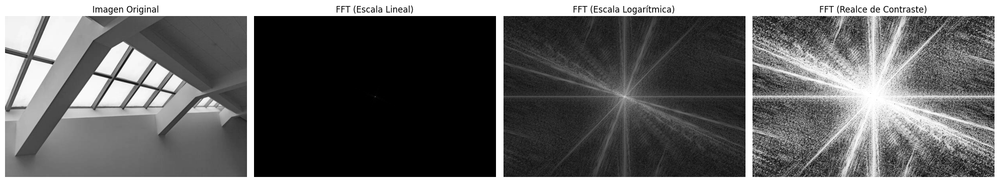

In [ ]:
# Subir imagen desde tu equipo local
uploaded = files.upload()

# Cargar la imagen
for filename in uploaded.keys():
    image = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)  # Cargar en escala de grises

# Normalizar la imagen a valores entre 0 y 1
image_normalized = image / 255.0

# Calcular la FFT 2D
fft = np.fft.fft2(image_normalized)  # FFT 2D
fft_shift = fftshift(fft)  # Centrar frecuencias bajas en el medio
magnitude_spectrum = np.abs(fft_shift)  # Magnitud de la FFT

# Aplicar escala logarítmica para mejorar la visualización
log_magnitude = np.log1p(magnitude_spectrum)  # log(1 + |FFT|)

# Ajuste del contraste (realzar blancos y negros)
adjusted_magnitude = cv2.normalize(log_magnitude, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# Aplicar una técnica de realce adicional (opcional): ecualización del histograma
equalized_magnitude = cv2.equalizeHist(adjusted_magnitude)

# Graficar los resultados
plt.figure(figsize=(20, 10))

# Imagen original
plt.subplot(1, 4, 1)
plt.title("Imagen Original")
plt.imshow(image_normalized, cmap="gray")
plt.axis("off")

# FFT sin escalar
plt.subplot(1, 4, 2)
plt.title("FFT (Escala Lineal)")
plt.imshow(magnitude_spectrum, cmap="gray")
plt.axis("off")

# FFT en escala logarítmica
plt.subplot(1, 4, 3)
plt.title("FFT (Escala Logarítmica)")
plt.imshow(log_magnitude, cmap="gray")
plt.axis("off")

# FFT con realce de contraste
plt.subplot(1, 4, 4)
plt.title("FFT (Realce de Contraste)")
plt.imshow(equalized_magnitude, cmap="gray")
plt.axis("off")

plt.tight_layout()
plt.show()

Saving cameraman.png to cameraman.png


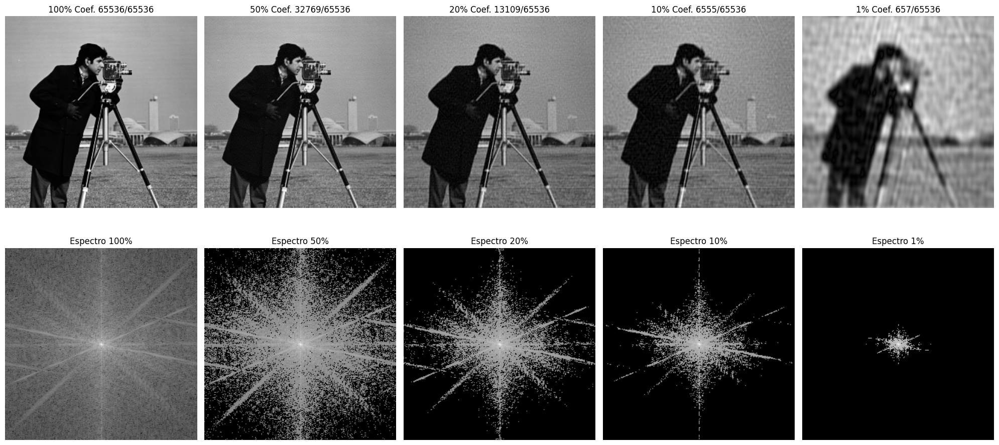

In [ ]:
# Paso 1: Subir archivo desde local
uploaded = files.upload()

# Paso 2: Cargar la imagen
for filename in uploaded.keys():
    img = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)

# Paso 3: Aplicar FFT 2D
fft_result = fftshift(fft2(img))

# Calcular la magnitud del espectro de Fourier
magnitud = np.abs(fft_result)

# Paso 4: Visualizar compresión con diferentes porcentajes
porcentajes = [100, 50, 20, 10, 1]  # Incluye el 100% como referencia
fig, axes = plt.subplots(2, len(porcentajes), figsize=(20, 10))

# Lista para almacenar información de compresión
tamanios = []

for i, porcentaje in enumerate(porcentajes):
    if porcentaje == 100:
        # Si el porcentaje es 100, usa la FFT completa sin filtrar
        fft_result_filtrado = fft_result
    else:
        # Determinar el umbral de coeficientes para otros porcentajes
        umbral = np.percentile(magnitud, 100 - porcentaje)
        fft_result_filtrado = np.where(magnitud >= umbral, fft_result, 0)

    # Reconstruir la imagen usando la FFT inversa
    imagen_reconstruida = np.abs(ifft2(ifftshift(fft_result_filtrado)))

    # Calcular el número de coeficientes retenidos
    coef_retenidos = np.count_nonzero(fft_result_filtrado)
    coef_totales = fft_result.size
    compresion = coef_retenidos / coef_totales * 100  # Porcentaje de coeficientes usados
    tamanios.append((porcentaje, coef_retenidos, coef_totales, compresion))

    # Mostrar la imagen reconstruida
    axes[0, i].imshow(imagen_reconstruida, cmap='gray')
    axes[0, i].set_title(f"{porcentaje}% Coef. {coef_retenidos }/{coef_totales}")
    axes[0, i].axis('off')

    # Mostrar los coeficientes retenidos
    axes[1, i].imshow(np.log(1 + np.abs(fft_result_filtrado)), cmap='gray')
    axes[1, i].set_title(f"Espectro {porcentaje}%")
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

Saving Steve-Mccurry-Afghan.jpg to Steve-Mccurry-Afghan (1).jpg


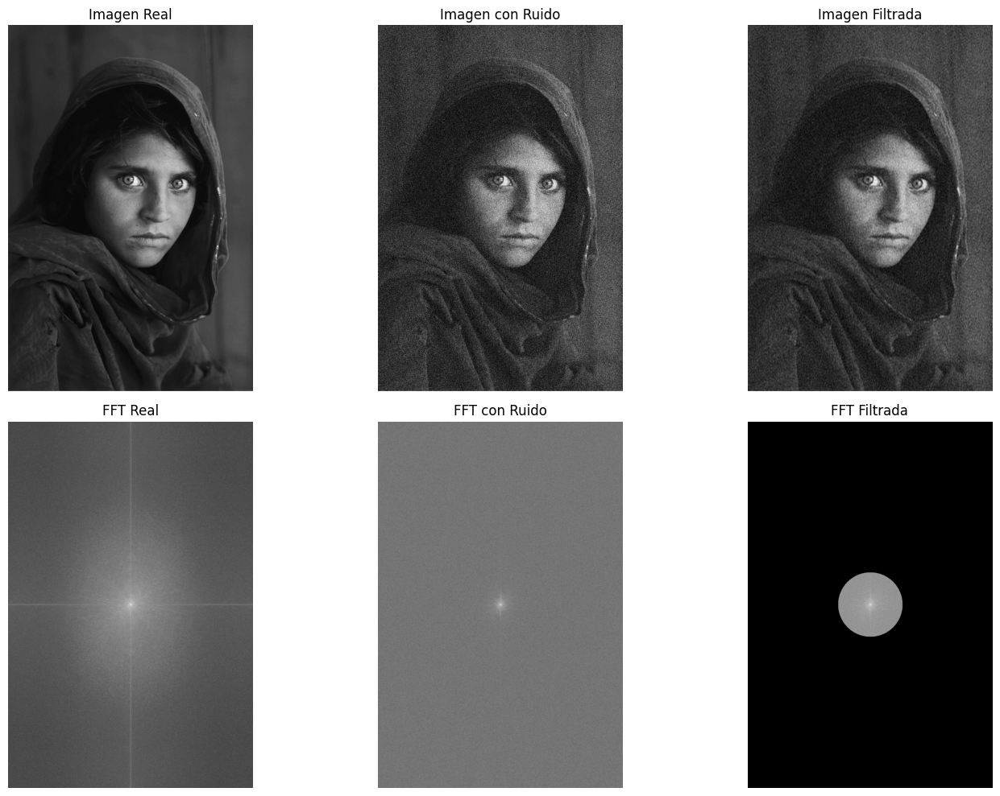

In [ ]:
# Paso 1: Subir una imagen
uploaded = files.upload()

# Leer la imagen subida (asumiendo que es la primera)
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Paso 2: Añadir ruido gaussiano a la imagen
def add_gaussian_noise(image, mean=0, stddev=25):
    gaussian_noise = np.random.normal(mean, stddev, image.shape).astype(np.float32)
    noisy_image = cv2.add(image.astype(np.float32), gaussian_noise)
    noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)
    return noisy_image

# Agregar ruido gaussiano
noisy_image = add_gaussian_noise(image, mean=0, stddev=50)

# Paso 3: Transformada de Fourier 2D
fft_original = fftshift(fft2(image))
fft_noisy = fftshift(fft2(noisy_image))

# Paso 4: Filtrar altas frecuencias
rows, cols = image.shape
crow, ccol = rows // 2, cols // 2
radius = 150  # Tamaño del filtro circular
mask = np.zeros((rows, cols), dtype=np.uint8)
cv2.circle(mask, (ccol, crow), radius, 1, thickness=-1)

# Aplicar el filtro
fft_filtered = fft_noisy * mask

# Transformada inversa para obtener la imagen filtrada
filtered_image = np.abs(ifft2(fftshift(fft_filtered))).astype(np.uint8)

# Paso 5: Mostrar resultados
plt.figure(figsize=(15, 10))

# Primera fila: dominio espacial
plt.subplot(2, 3, 1)
plt.imshow(image, cmap='gray')
plt.title("Imagen Real")
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(noisy_image, cmap='gray')
plt.title("Imagen con Ruido")
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(filtered_image, cmap='gray')
plt.title("Imagen Filtrada")
plt.axis('off')

# Segunda fila: dominio de frecuencia
plt.subplot(2, 3, 4)
plt.imshow(np.log(1 + np.abs(fft_original)), cmap='gray')
plt.title("FFT Real")
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(np.log(1 + np.abs(fft_noisy)), cmap='gray')
plt.title("FFT con Ruido")
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(np.log(1 + np.abs(fft_filtered)), cmap='gray')
plt.title("FFT Filtrada")
plt.axis('off')

plt.tight_layout()
plt.show()

Saving Steve-Mccurry-Afghan.jpg to Steve-Mccurry-Afghan (2).jpg


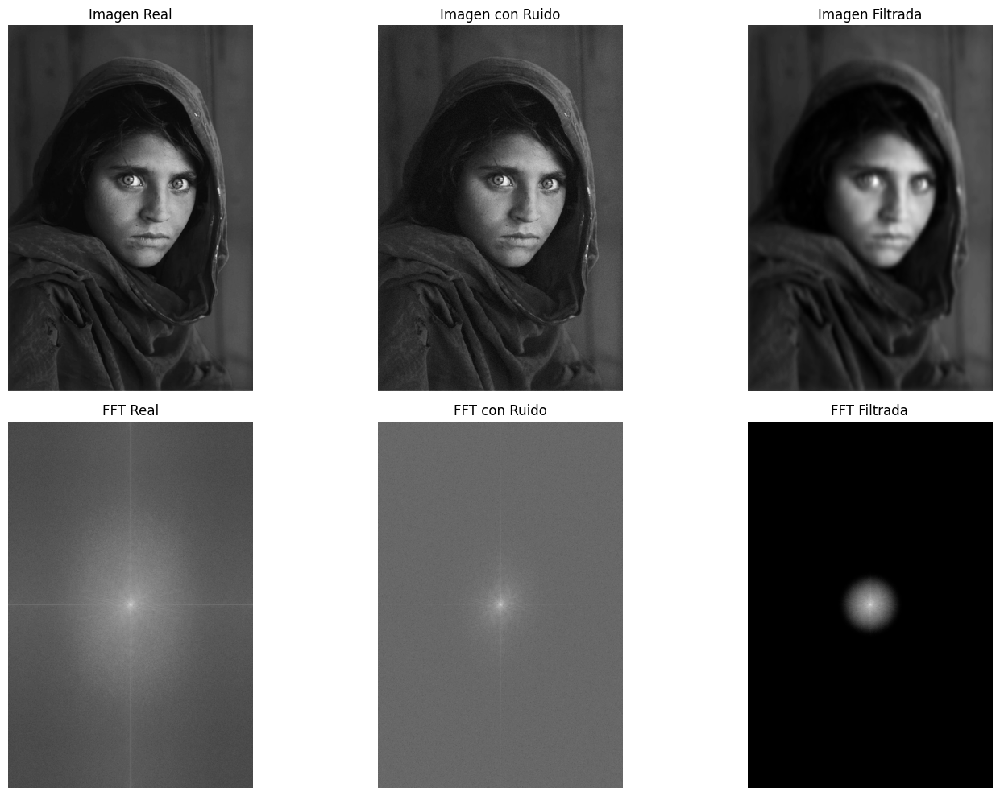

In [ ]:
# Paso 1: Subir una imagen
uploaded = files.upload()

# Leer la imagen subida (asumiendo que es la primera)
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Paso 2: Añadir ruido gaussiano a la imagen
def add_gaussian_noise(image, mean=0, stddev=25):
    gaussian_noise = np.random.normal(mean, stddev, image.shape).astype(np.float32)
    noisy_image = cv2.add(image.astype(np.float32), gaussian_noise)
    noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)
    return noisy_image

# Agregar ruido gaussiano
noisy_image = add_gaussian_noise(image, mean=0, stddev=10)

# Paso 3: Transformada de Fourier 2D
fft_original = fftshift(fft2(image))
fft_noisy = fftshift(fft2(noisy_image))

# Paso 4: Crear un filtro gaussiano en el dominio de frecuencia
rows, cols = image.shape
crow, ccol = rows // 2, cols // 2
sigma = 30  # Desviación estándar del filtro gaussiano
x, y = np.meshgrid(np.arange(cols), np.arange(rows))
x = x - ccol
y = y - crow
gaussian_filter = np.exp(-(x**2 + y**2) / (2 * sigma**2))

# Aplicar el filtro
fft_filtered = fft_noisy * gaussian_filter

# Transformada inversa para obtener la imagen filtrada
filtered_image = np.abs(ifft2(fftshift(fft_filtered)))
filtered_image = np.clip(filtered_image, 0, 255).astype(np.uint8)

# Paso 5: Mostrar resultados
plt.figure(figsize=(15, 10))

# Primera fila: dominio espacial
plt.subplot(2, 3, 1)
plt.imshow(image, cmap='gray')
plt.title("Imagen Real")
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(noisy_image, cmap='gray')
plt.title("Imagen con Ruido")
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(filtered_image, cmap='gray')
plt.title("Imagen Filtrada")
plt.axis('off')

# Segunda fila: dominio de frecuencia
plt.subplot(2, 3, 4)
plt.imshow(np.log(1 + np.abs(fft_original)), cmap='gray')
plt.title("FFT Real")
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(np.log(1 + np.abs(fft_noisy)), cmap='gray')
plt.title("FFT con Ruido")
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(np.log(1 + np.abs(fft_filtered)), cmap='gray')
plt.title("FFT Filtrada")
plt.axis('off')

plt.tight_layout()
plt.show()

Saving coins.jpg to coins.jpg


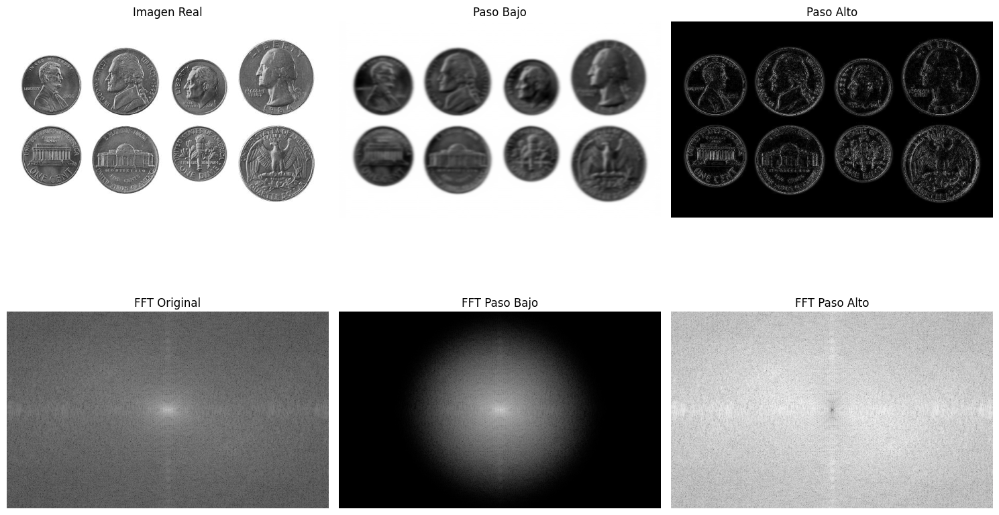

In [ ]:
# Paso 1: Subir una imagen
uploaded = files.upload()

# Leer la imagen subida (asumiendo que es la primera)
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Paso 2: Transformada de Fourier 2D
fft_original = fftshift(fft2(image))

# Paso 3: Crear filtros gaussianos (paso bajo y paso alto)
rows, cols = image.shape
crow, ccol = rows // 2, cols // 2
sigma = 40  # Parámetro del filtro gaussiano

# Coordenadas
x, y = np.meshgrid(np.arange(cols), np.arange(rows))
x = x - ccol
y = y - crow

# Filtros gaussianos
low_pass_filter = np.exp(-(x**2 + y**2) / (2 * sigma**2))
high_pass_filter = 1 - low_pass_filter

# Paso 4: Aplicar los filtros en el dominio de frecuencias
fft_low = fft_original * low_pass_filter
fft_high = fft_original * high_pass_filter

# Paso 5: Transformada inversa para obtener las imágenes filtradas
low_pass_image = np.abs(ifft2(fftshift(fft_low))).astype(np.uint8)
high_pass_image = np.abs(ifft2(fftshift(fft_high))).astype(np.uint8)

# Paso 6: Mostrar resultados
plt.figure(figsize=(15, 10))

# Fila 1: imágenes en el dominio espacial
plt.subplot(2, 3, 1)
plt.imshow(image, cmap='gray')
plt.title("Imagen Real")
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(low_pass_image, cmap='gray')
plt.title("Paso Bajo")
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(high_pass_image, cmap='gray')
plt.title("Paso Alto")
plt.axis('off')

# Fila 2: espectros de frecuencia
plt.subplot(2, 3, 4)
plt.imshow(np.log(1 + np.abs(fft_original)), cmap='gray')
plt.title("FFT Original")
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(np.log(1 + np.abs(fft_low)), cmap='gray')
plt.title("FFT Paso Bajo")
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(np.log(1 + np.abs(fft_high)), cmap='gray')
plt.title("FFT Paso Alto")
plt.axis('off')

plt.tight_layout()
plt.show()

Saving pnois1.jpg to pnois1.jpg


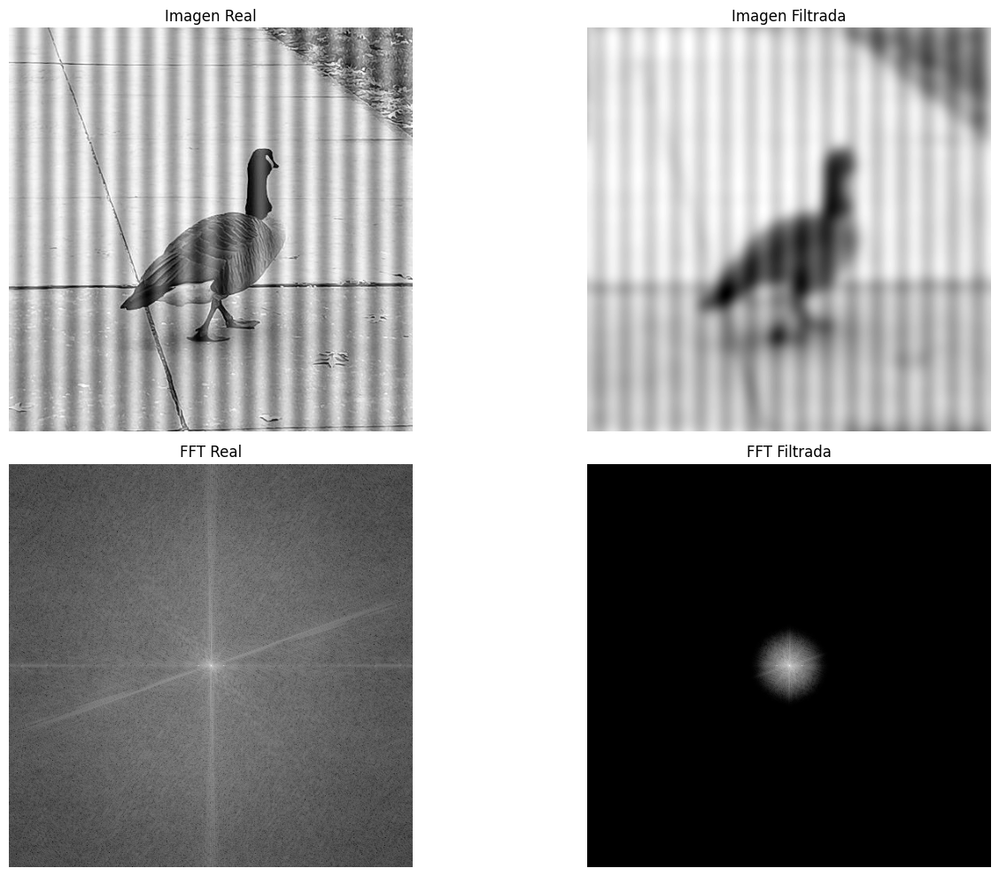

In [ ]:
# Paso 1: Subir una imagen
uploaded = files.upload()

# Leer la imagen subida (asumiendo que es la primera)
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)


# Paso 3: Transformada de Fourier 2D
fft_original = fftshift(fft2(image))

# Paso 4: Crear un filtro gaussiano en el dominio de frecuencia
rows, cols = image.shape
crow, ccol = rows // 2, cols // 2
sigma = 10  # Desviación estándar del filtro gaussiano
x, y = np.meshgrid(np.arange(cols), np.arange(rows))
x = x - ccol
y = y - crow
gaussian_filter = np.exp(-(x**2 + y**2) / (2 * sigma**2))

# Aplicar el filtro
fft_filtered = fft_original * gaussian_filter

# Transformada inversa para obtener la imagen filtrada
filtered_image = np.abs(ifft2(fftshift(fft_filtered)))
filtered_image = np.clip(filtered_image, 0, 255).astype(np.uint8)

# Paso 5: Mostrar resultados
plt.figure(figsize=(15, 10))

# Primera fila: dominio espacial
plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title("Imagen Real")
plt.axis('off')


plt.subplot(2, 2, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title("Imagen Filtrada")
plt.axis('off')

# Segunda fila: dominio de frecuencia
plt.subplot(2, 2, 3)
plt.imshow(np.log(1 + np.abs(fft_original)), cmap='gray')
plt.title("FFT Real")
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(np.log(1 + np.abs(fft_filtered)), cmap='gray')
plt.title("FFT Filtrada")
plt.axis('off')

plt.tight_layout()
plt.show()

Saving period_input.jpg to period_input (3).jpg


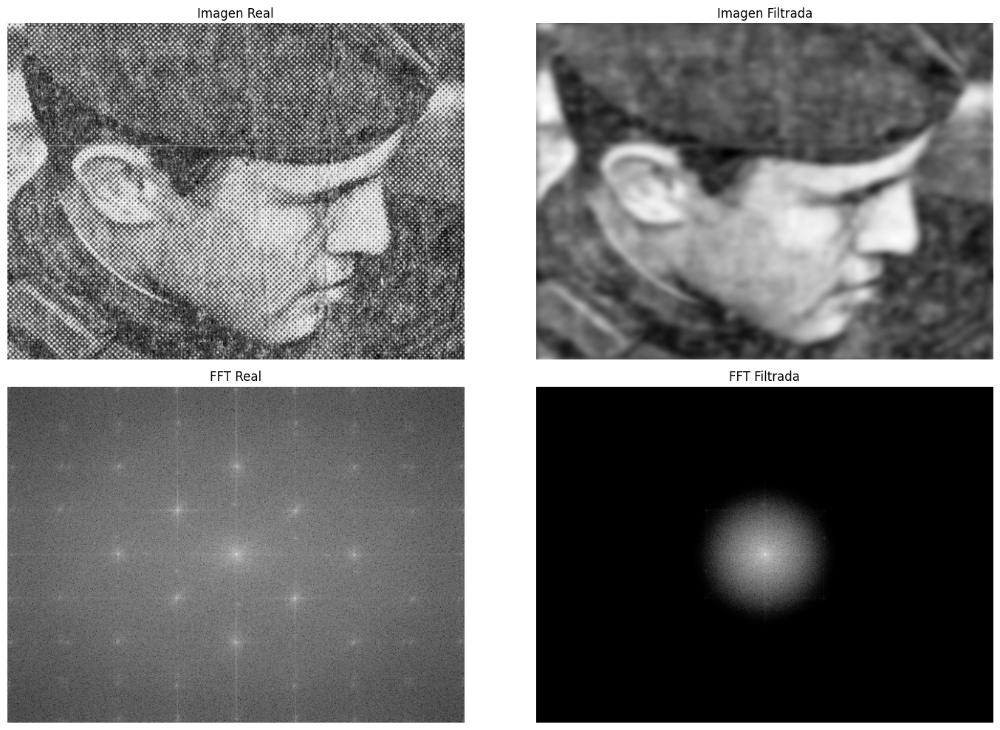

In [ ]:
# Paso 1: Subir una imagen
uploaded = files.upload()

# Leer la imagen subida (asumiendo que es la primera)
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)


# Paso 3: Transformada de Fourier 2D
fft_original = fftshift(fft2(image))

# Paso 4: Crear un filtro gaussiano en el dominio de frecuencia
rows, cols = image.shape
crow, ccol = rows // 2, cols // 2
sigma = 20  # Desviación estándar del filtro gaussiano
x, y = np.meshgrid(np.arange(cols), np.arange(rows))
x = x - ccol
y = y - crow
gaussian_filter = np.exp(-(x**2 + y**2) / (2 * sigma**2))

# Aplicar el filtro
fft_filtered = fft_original * gaussian_filter

# Transformada inversa para obtener la imagen filtrada
filtered_image = np.abs(ifft2(fftshift(fft_filtered)))
filtered_image = np.clip(filtered_image, 0, 255).astype(np.uint8)

# Paso 5: Mostrar resultados
plt.figure(figsize=(15, 10))

# Primera fila: dominio espacial
plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title("Imagen Real")
plt.axis('off')


plt.subplot(2, 2, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title("Imagen Filtrada")
plt.axis('off')

# Segunda fila: dominio de frecuencia
plt.subplot(2, 2, 3)
plt.imshow(np.log(1 + np.abs(fft_original)), cmap='gray')
plt.title("FFT Real")
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(np.log(1 + np.abs(fft_filtered)), cmap='gray')
plt.title("FFT Filtrada")
plt.axis('off')

plt.tight_layout()
plt.show()

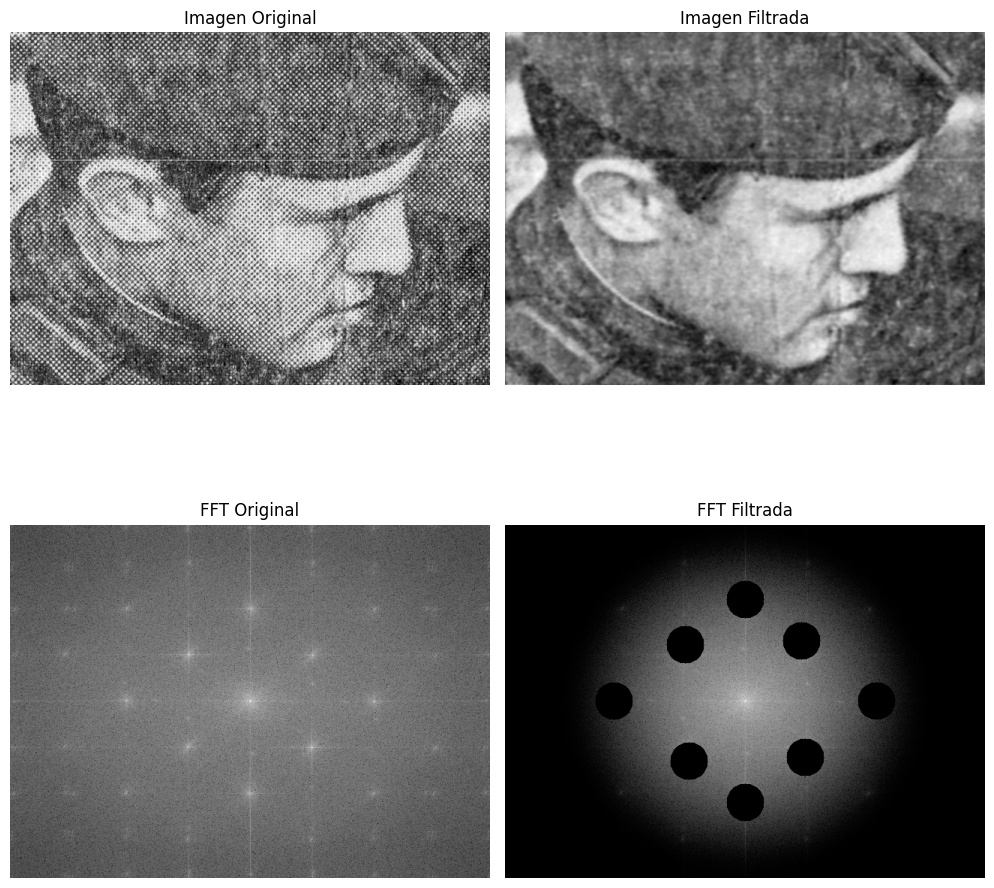

In [ ]:
# Paso 1: Subir una imagen
uploaded = files.upload()

# Leer la imagen subida (asumiendo que es la primera)
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Paso 2: Transformada de Fourier 2D
fft_original = fftshift(fft2(image))

# Paso 3: Identificar y eliminar ruido periódico
# Crear una copia del espectro para manipulación
fft_filtered = fft_original.copy()

# Suprimir manualmente puntos específicos de ruido periódico
# Los valores (u, v) deben ajustarse según la inspección del espectro
rows, cols = fft_filtered.shape
crow, ccol = rows // 2, cols // 2  # Centro del espectro

# Ejemplo: eliminar ruido periódico en posiciones específicas
radius = 25  # Radio del área de eliminación
mask = np.ones_like(fft_filtered, dtype=np.float32)
cv2.circle(mask, (ccol + 175, crow), radius, 0, thickness=-1)  # Ruido a la derecha
cv2.circle(mask, (ccol - 175, crow), radius, 0, thickness=-1)  # Ruido a la izquierda
cv2.circle(mask, (ccol, crow + 135), radius, 0, thickness=-1)  # Ruido a la izquierda
cv2.circle(mask, (ccol, crow - 135), radius, 0, thickness=-1)  # Ruido a la izquierda
cv2.circle(mask, (ccol+80, crow + 75), radius, 0, thickness=-1)  # Ruido a la izquierda
cv2.circle(mask, (ccol-80, crow - 75), radius, 0, thickness=-1)  # Ruido a la izquierda
cv2.circle(mask, (ccol-75, crow + 80), radius, 0, thickness=-1)  # Ruido a la izquierda
cv2.circle(mask, (ccol+75, crow - 80), radius, 0, thickness=-1)  # Ruido a la izquierda
fft_filtered *= mask

# Paso 4: Crear un filtro gaussiano en el dominio de frecuencia
rows, cols = image.shape
crow, ccol = rows // 2, cols // 2
sigma = 50  # Desviación estándar del filtro gaussiano
x, y = np.meshgrid(np.arange(cols), np.arange(rows))
x = x - ccol
y = y - crow
gaussian_filter = np.exp(-(x**2 + y**2) / (2 * sigma**2))

# Aplicar el filtro
fft_filtered = fft_filtered * gaussian_filter

# Paso 4: Transformada inversa para obtener la imagen filtrada
filtered_image = np.abs(ifft2(fftshift(fft_filtered))).astype(np.uint8)

# Paso 5: Mostrar resultados
plt.figure(figsize=(15, 10))

# Fila 1: imágenes en el dominio espacial
plt.subplot(2, 3, 1)
plt.imshow(image, cmap='gray')
plt.title("Imagen Original")
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title("Imagen Filtrada")
plt.axis('off')

# Fila 2: espectros de frecuencia
plt.subplot(2, 3, 4)
plt.imshow(np.log(1 + np.abs(fft_original)), cmap='gray')
plt.title("FFT Original")
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(np.log(1 + np.abs(fft_filtered)), cmap='gray')
plt.title("FFT Filtrada")
plt.axis('off')

plt.tight_layout()
plt.show()

Saving pnois1.jpg to pnois1 (1).jpg


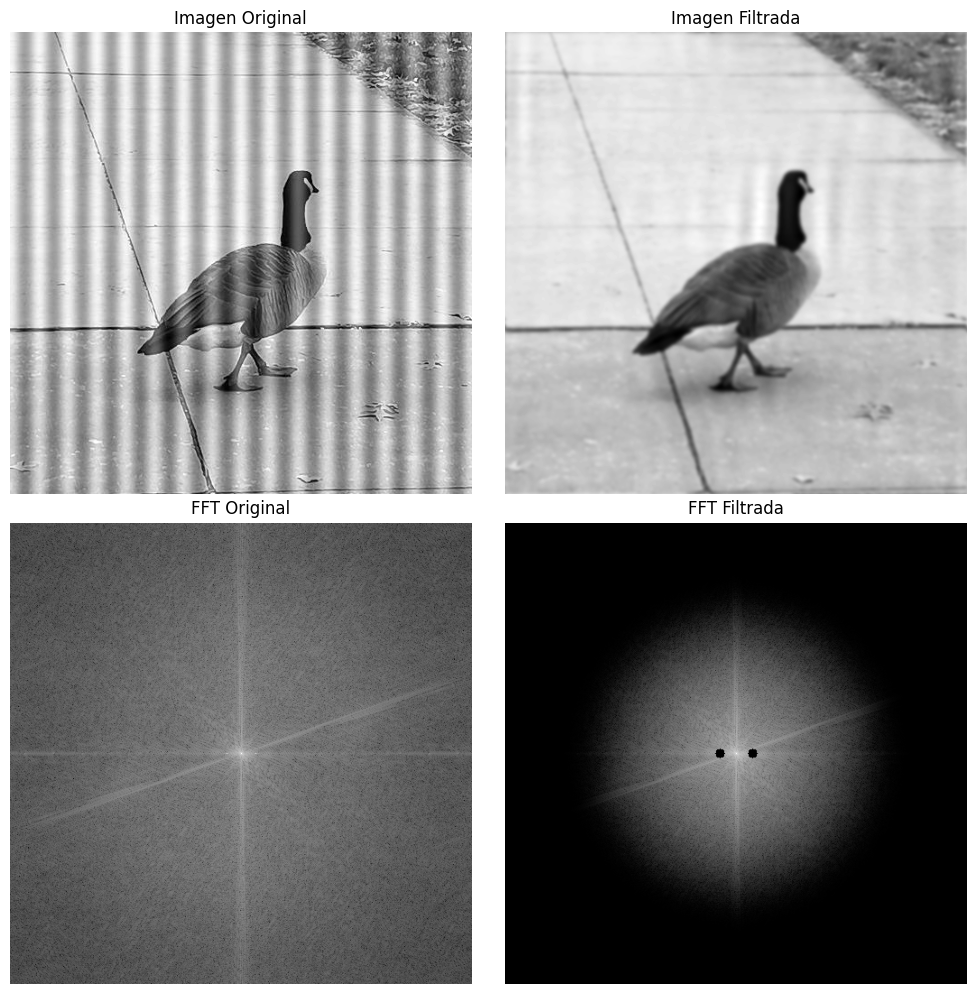

In [ ]:
# Paso 1: Subir una imagen
uploaded = files.upload()

# Leer la imagen subida (asumiendo que es la primera)
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)


# Paso 2: Transformada de Fourier 2D
fft_original = fftshift(fft2(image))

# Paso 3: Identificar y eliminar ruido periódico
# Crear una copia del espectro para manipulación
fft_filtered = fft_original.copy()

# Suprimir manualmente puntos específicos de ruido periódico
# Los valores (u, v) deben ajustarse según la inspección del espectro
rows, cols = fft_filtered.shape
crow, ccol = rows // 2, cols // 2  # Centro del espectro

# Ejemplo: eliminar ruido periódico en posiciones específicas
radius = 5  # Radio del área de eliminación
mask = np.ones_like(fft_filtered, dtype=np.float32)
cv2.circle(mask, (ccol + 18, crow), radius, 0, thickness=-1)  # Ruido a la derecha
cv2.circle(mask, (ccol - 18, crow), radius, 0, thickness=-1)  # Ruido a la izquierda
fft_filtered *= mask

# Paso 4: Crear un filtro gaussiano en el dominio de frecuencia
rows, cols = image.shape
crow, ccol = rows // 2, cols // 2
sigma = 40  # Desviación estándar del filtro gaussiano
x, y = np.meshgrid(np.arange(cols), np.arange(rows))
x = x - ccol
y = y - crow
gaussian_filter = np.exp(-(x**2 + y**2) / (2 * sigma**2))

# Aplicar el filtro
fft_filtered = fft_filtered * gaussian_filter

# Paso 4: Transformada inversa para obtener la imagen filtrada
filtered_image = np.abs(ifft2(fftshift(fft_filtered))).astype(np.uint8)

# Paso 5: Mostrar resultados
plt.figure(figsize=(15, 10))

# Fila 1: imágenes en el dominio espacial
plt.subplot(2, 3, 1)
plt.imshow(image, cmap='gray')
plt.title("Imagen Original")
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(filtered_image, cmap='gray')
plt.title("Imagen Filtrada")
plt.axis('off')

# Fila 2: espectros de frecuencia
plt.subplot(2, 3, 4)
plt.imshow(np.log(1 + np.abs(fft_original)), cmap='gray')
plt.title("FFT Original")
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(np.log(1 + np.abs(fft_filtered)), cmap='gray')
plt.title("FFT Filtrada")
plt.axis('off')

plt.tight_layout()
plt.show()

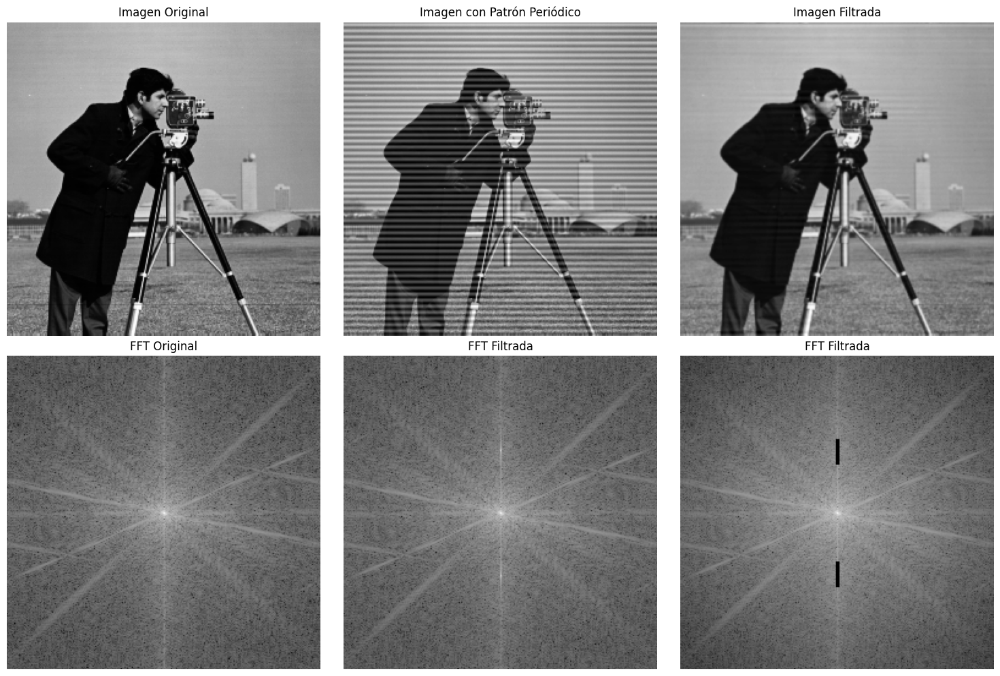

In [ ]:
# Paso 1: Subir una imagen
uploaded = files.upload()

# Leer la imagen subida (asumiendo que es la primera)
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Crear un patrón periódico (rejilla sinusoidal) y superponerlo a la imagen original
rows, cols = image.shape
x = np.arange(cols)
y = np.arange(rows)
x, y = np.meshgrid(x, y)

# Definir el patrón periódico
frequency = 5  # Frecuencia del patrón
sinusoidal_pattern = (127.5 * (1 + np.sin(2 * np.pi * y / frequency))).astype(np.uint8)

# Superponer el patrón periódico a la imagen original
image_with_pattern = cv2.addWeighted(image, 0.7, sinusoidal_pattern, 0.3, 0)

# Paso 2: Transformada de Fourier 2D
fft_original_1 = fftshift(fft2(image))
fft_original = fftshift(fft2(image_with_pattern))


# Paso 3: Identificar y eliminar ruido periódico
# Crear una copia del espectro para manipulación
fft_filtered = fft_original.copy()

# Suprimir manualmente áreas específicas de ruido periódico con máscaras rectangulares
rows, cols = fft_filtered.shape
crow, ccol = rows // 2, cols // 2  # Centro del espectro

# Crear una máscara inicializada en 1 (sin bloqueo)
mask = np.ones_like(fft_filtered, dtype=np.float32)

# Definir las coordenadas de las máscaras rectangulares
# Ejemplo: Eliminar ruido a la derecha y la izquierda del centro
cv2.rectangle(mask, (ccol - 1, crow + 40), (ccol + 1, crow + 60), 0, thickness=-1)  # Rectángulo abajo
cv2.rectangle(mask, (ccol - 1, crow - 40), (ccol + 1, crow - 60), 0, thickness=-1)  # Rectángulo arriba

# Aplicar la máscara al espectro
fft_filtered *= mask

# Paso 4: Crear un filtro gaussiano en el dominio de frecuencia
sigma = 80  # Desviación estándar del filtro gaussiano
x, y = np.meshgrid(np.arange(cols), np.arange(rows))
x = x - ccol
y = y - crow
gaussian_filter = np.exp(-(x**2 + y**2) / (2 * sigma**2))

# Aplicar el filtro gaussiano
fft_filtered = fft_filtered * gaussian_filter

# Paso 5: Transformada inversa para obtener la imagen filtrada
filtered_image = np.abs(ifft2(fftshift(fft_filtered))).astype(np.uint8)

# Paso 6: Mostrar resultados
plt.figure(figsize=(15, 10))

# Fila 1: imágenes en el dominio espacial
plt.subplot(2, 3, 1)
plt.imshow(image, cmap='gray')
plt.title("Imagen Original")
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(image_with_pattern, cmap='gray')
plt.title("Imagen con Patrón Periódico")
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(filtered_image, cmap='gray')
plt.title("Imagen Filtrada")
plt.axis('off')

# Fila 2: espectros de frecuencia
plt.subplot(2, 3, 4)
plt.imshow(np.log(1 + np.abs(fft_original_1)), cmap='gray')
plt.title("FFT Original")
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(np.log(1 + np.abs(fft_original)), cmap='gray')
plt.title("FFT Filtrada")
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(np.log(1 + np.abs(fft_filtered)), cmap='gray')
plt.title("FFT Filtrada")
plt.axis('off')

plt.tight_layout()
plt.show()

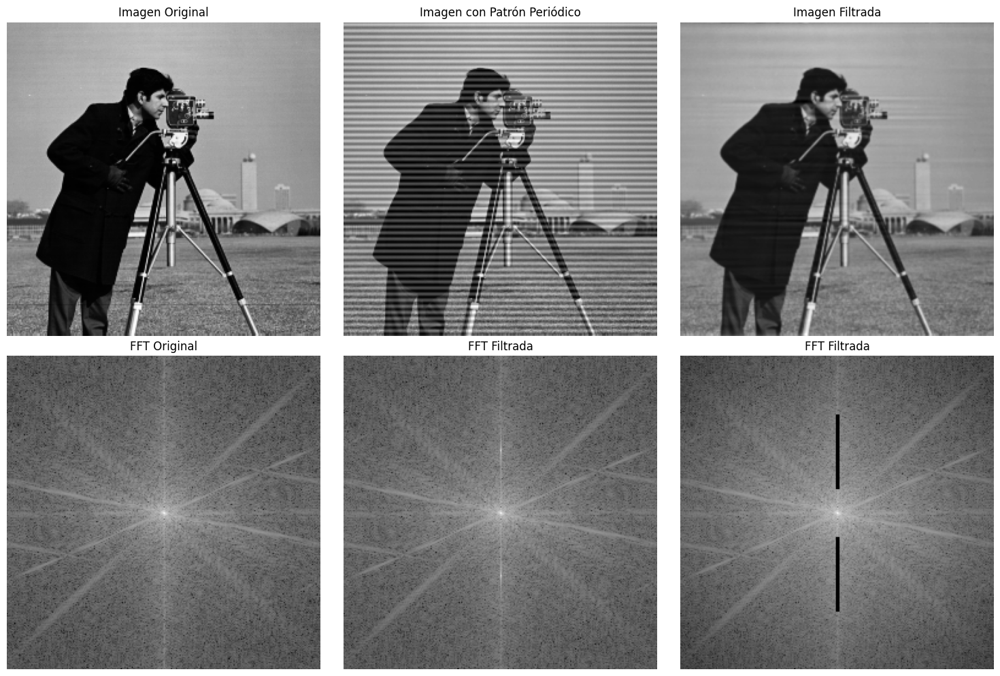

In [ ]:
# Paso 1: Subir una imagen
uploaded = files.upload()

# Leer la imagen subida (asumiendo que es la primera)
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Crear un patrón periódico (rejilla sinusoidal) y superponerlo a la imagen original
rows, cols = image.shape
x = np.arange(cols)
y = np.arange(rows)
x, y = np.meshgrid(x, y)

# Definir el patrón periódico
frequency = 5  # Frecuencia del patrón
sinusoidal_pattern = (127.5 * (1 + np.sin(2 * np.pi * y / frequency))).astype(np.uint8)

# Superponer el patrón periódico a la imagen original
image_with_pattern = cv2.addWeighted(image, 0.7, sinusoidal_pattern, 0.3, 0)

# Paso 2: Transformada de Fourier 2D
fft_original_1 = fftshift(fft2(image))
fft_original = fftshift(fft2(image_with_pattern))


# Paso 3: Identificar y eliminar ruido periódico
# Crear una copia del espectro para manipulación
fft_filtered = fft_original.copy()

# Suprimir manualmente áreas específicas de ruido periódico con máscaras rectangulares
rows, cols = fft_filtered.shape
crow, ccol = rows // 2, cols // 2  # Centro del espectro

# Crear una máscara inicializada en 1 (sin bloqueo)
mask = np.ones_like(fft_filtered, dtype=np.float32)

# Definir las coordenadas de las máscaras rectangulares
# Ejemplo: Eliminar ruido a la derecha y la izquierda del centro
cv2.rectangle(mask, (ccol - 1, crow + 20), (ccol + 1, crow + 80), 0, thickness=-1)  # Rectángulo abajo
cv2.rectangle(mask, (ccol - 1, crow - 20), (ccol + 1, crow - 80), 0, thickness=-1)  # Rectángulo arriba
# Ejemplo: Eliminar ruido arriba y abajo del centro
# cv2.rectangle(mask, (ccol + 50, crow - 15), (ccol + 50, crow + 15), 0, thickness=-1)  # Rectángulo derecha
# cv2.rectangle(mask, (ccol - 50, crow - 15), (ccol - 50, crow + 15), 0, thickness=-1)  # Rectángulo izquierda

# Aplicar la máscara al espectro
fft_filtered *= mask

# Paso 4: Crear un filtro gaussiano en el dominio de frecuencia
sigma = 80  # Desviación estándar del filtro gaussiano
x, y = np.meshgrid(np.arange(cols), np.arange(rows))
x = x - ccol
y = y - crow
gaussian_filter = np.exp(-(x**2 + y**2) / (2 * sigma**2))

# Aplicar el filtro gaussiano
fft_filtered = fft_filtered * gaussian_filter

# Paso 5: Transformada inversa para obtener la imagen filtrada
filtered_image = np.abs(ifft2(fftshift(fft_filtered))).astype(np.uint8)

# Paso 6: Mostrar resultados
plt.figure(figsize=(15, 10))

# Fila 1: imágenes en el dominio espacial
plt.subplot(2, 3, 1)
plt.imshow(image, cmap='gray')
plt.title("Imagen Original")
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(image_with_pattern, cmap='gray')
plt.title("Imagen con Patrón Periódico")
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(filtered_image, cmap='gray')
plt.title("Imagen Filtrada")
plt.axis('off')

# Fila 2: espectros de frecuencia
plt.subplot(2, 3, 4)
plt.imshow(np.log(1 + np.abs(fft_original_1)), cmap='gray')
plt.title("FFT Original")
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(np.log(1 + np.abs(fft_original)), cmap='gray')
plt.title("FFT Filtrada")
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(np.log(1 + np.abs(fft_filtered)), cmap='gray')
plt.title("FFT Filtrada")
plt.axis('off')

plt.tight_layout()
plt.show()